In [12]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt

# Load datasets
nav_df = pd.read_csv("../data/raw/02_nav_history.csv")
fund_df = pd.read_csv("../data/raw/01_fund_master.csv")

# Convert date
nav_df["date"] = pd.to_datetime(nav_df["date"])

In [3]:
nav_merged = nav_df.merge(
    fund_df[["amfi_code", "scheme_name"]],
    on="amfi_code",
    how="left"
)

In [4]:
nav_merged.head()

,amfi_code,date,nav,scheme_name
0,119551,2022-01-03,54.3856,SBI Bluechip Fund - Regular Plan - Growth
1,119551,2022-01-04,54.3474,SBI Bluechip Fund - Regular Plan - Growth
2,119551,2022-01-05,54.6869,SBI Bluechip Fund - Regular Plan - Growth
3,119551,2022-01-06,55.4550,SBI Bluechip Fund - Regular Plan - Growth
4,119551,2022-01-07,55.3692,SBI Bluechip Fund - Regular Plan - Growth


In [5]:
fig = px.line(
    nav_merged,
    x="date",
    y="nav",
    color="scheme_name",
    title="Daily NAV Trend of Mutual Fund Schemes (2022-2026)"
)

In [6]:
fig.add_vrect(
    x0="2023-01-01",
    x1="2023-12-31",
    annotation_text="2023 Bull Run",
    annotation_position="top left",
    opacity=0.2
)

In [7]:
fig.add_vrect(
    x0="2024-01-01",
    x1="2024-12-31",
    annotation_text="2024 Correction",
    annotation_position="top right",
    opacity=0.15
)

In [8]:
fig.update_layout(
    height=700,
    xaxis_title="Date",
    yaxis_title="NAV",
    legend_title="Scheme"
)

In [9]:
fig.show()

In [16]:
plt.savefig(
    "../charts/nav_trend_analysis.png",
    dpi=300,
    bbox_inches="tight"
)

<Figure size 640x480 with 0 Axes>

In [15]:
fig.show()

## 1. NAV Trend Analysis

This chart visualizes the daily NAV movement of all 40 mutual fund schemes from 2022–2026. The highlighted regions indicate the strong market rally during 2023 and the correction phase during 2024. The visualization helps compare long-term growth patterns across schemes and identify periods of market-wide impact.

In [17]:
print(nav_merged.shape)
print(nav_merged.columns.tolist())

(46000, 4)
['amfi_code', 'date', 'nav', 'scheme_name']


In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

aum_df = pd.read_csv("../data/raw/03_aum_by_fund_house.csv")

In [20]:
aum_df.head()

,date,fund_house,aum_lakh_crore,aum_crore,num_schemes
0,2022-03-31,SBI Mutual Fund,6.05,605000,186
1,2022-03-31,ICICI Prudential MF,4.65,465000,216
2,2022-03-31,HDFC Mutual Fund,4.35,435000,195
3,2022-03-31,Nippon India MF,2.70,270000,177
4,2022-03-31,Kotak Mahindra MF,2.70,270000,168


In [21]:
aum_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date            90 non-null     str    
 1   fund_house      90 non-null     str    
 2   aum_lakh_crore  90 non-null     float64
 3   aum_crore       90 non-null     int64  
 4   num_schemes     90 non-null     int64  
dtypes: float64(1), int64(2), str(2)
memory usage: 3.6 KB


In [23]:
print(aum_df.columns)

Index(['date', 'fund_house', 'aum_lakh_crore', 'aum_crore', 'num_schemes'], dtype='str')


In [24]:
aum_df["date"] = pd.to_datetime(aum_df["date"])

In [25]:
aum_df["year"] = aum_df["date"].dt.year

In [26]:
print(aum_df["year"].unique())

[2022 2023 2024 2025]


In [27]:
aum_yearly = (
    aum_df.groupby(
        ["fund_house", "year"]
    )["aum_lakh_crore"]
    .mean()
    .reset_index()
)

In [28]:
aum_yearly.head()

,fund_house,year,aum_lakh_crore
0,Aditya Birla Sun Life MF,2022,2.815
1,Aditya Birla Sun Life MF,2023,2.915
2,Aditya Birla Sun Life MF,2024,3.620
3,Aditya Birla Sun Life MF,2025,4.225
4,Axis Mutual Fund,2022,2.450


In [29]:
latest_year = aum_yearly["year"].max()

order = (
    aum_yearly[aum_yearly["year"] == latest_year]
    .sort_values(
        "aum_lakh_crore",
        ascending=False
    )["fund_house"]
)

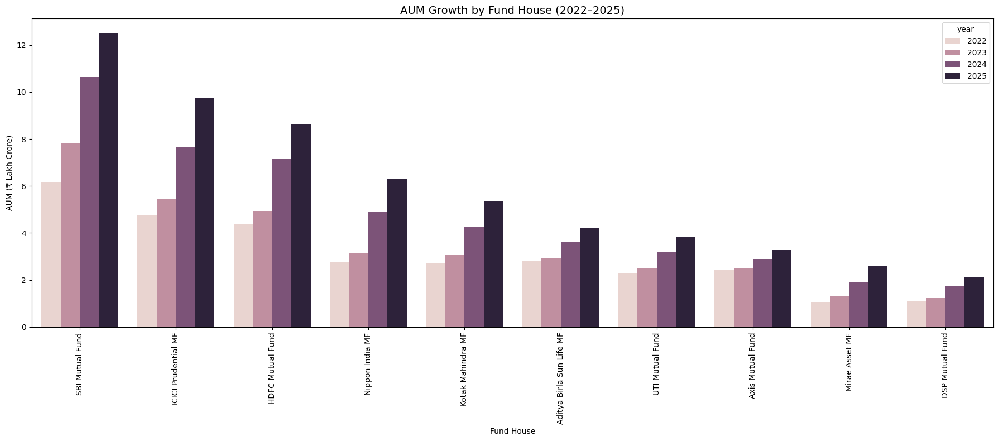

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(18,8))

sns.barplot(
    data=aum_yearly,
    x="fund_house",
    y="aum_lakh_crore",
    hue="year",
    order=order
)

plt.xticks(rotation=90)

plt.title(
    "AUM Growth by Fund House (2022–2025)",
    fontsize=14
)

plt.xlabel("Fund House")
plt.ylabel("AUM (₹ Lakh Crore)")

plt.tight_layout()

In [31]:
aum_yearly[
    aum_yearly["fund_house"].str.contains(
        "SBI",
        case=False,
        na=False
    )
]

,fund_house,year,aum_lakh_crore
32,SBI Mutual Fund,2022,6.175000
33,SBI Mutual Fund,2023,7.810000
34,SBI Mutual Fund,2024,10.646667
35,SBI Mutual Fund,2025,12.500000


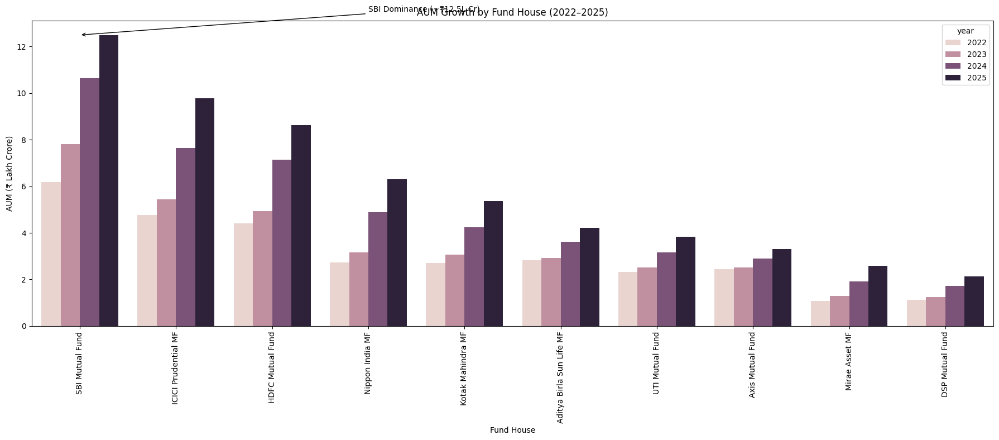

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(18,8))

sns.barplot(
    data=aum_yearly,
    x="fund_house",
    y="aum_lakh_crore",
    hue="year",
    order=order
)

plt.xticks(rotation=90)

plt.title("AUM Growth by Fund House (2022–2025)")
plt.xlabel("Fund House")
plt.ylabel("AUM (₹ Lakh Crore)")

# Annotation
plt.annotate(
    "SBI Dominance (~₹12.5L Cr)",
    xy=(0, 12.5),
    xytext=(3, 13.5),
    arrowprops=dict(arrowstyle="->")
)

plt.tight_layout()
plt.show()

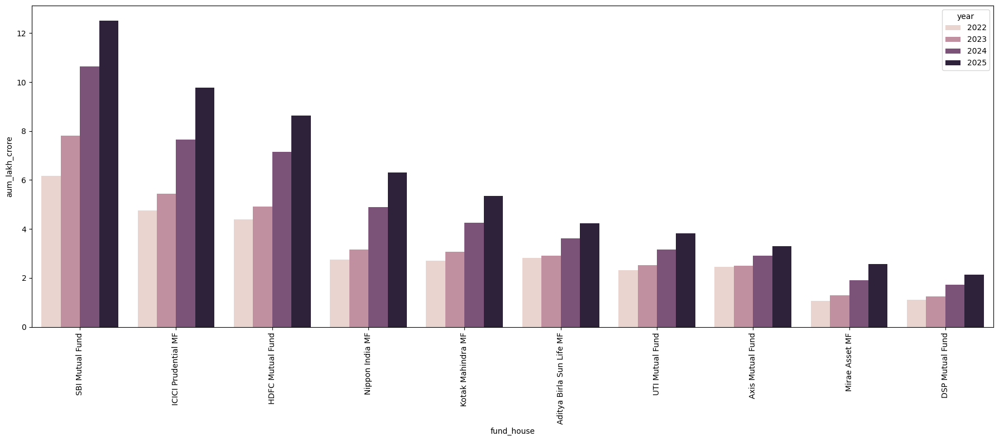

In [34]:
plt.figure(figsize=(18,8))

sns.barplot(
    data=aum_yearly,
    x="fund_house",
    y="aum_lakh_crore",
    hue="year",
    order=order
)

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## 2. AUM Growth by Fund House

This grouped bar chart compares the Assets Under Management (AUM) of major fund houses between 2022 and 2025. SBI Mutual Fund maintains a dominant position with AUM exceeding ₹12.5 lakh crore, while several other fund houses also show consistent year-over-year growth. The visualization highlights the increasing scale of the Indian mutual fund industry.

In [35]:
print(order.head())

35        SBI Mutual Fund
19    ICICI Prudential MF
15       HDFC Mutual Fund
31        Nippon India MF
23      Kotak Mahindra MF
Name: fund_house, dtype: str


In [36]:
plt.savefig(
    "../charts/aum_growth_bar_chart.png",
    bbox_inches="tight",
    dpi=300
)

<Figure size 640x480 with 0 Axes>

In [37]:
import pandas as pd

sip_df = pd.read_csv("../data/raw/04_monthly_sip_inflows.csv")

In [38]:
print(sip_df.columns)
sip_df.head()

Index(['month', 'sip_inflow_crore', 'active_sip_accounts_crore',
       'new_sip_accounts_lakh', 'sip_aum_lakh_crore', 'yoy_growth_pct'],
      dtype='str')


,month,sip_inflow_crore,active_sip_accounts_crore,new_sip_accounts_lakh,sip_aum_lakh_crore,yoy_growth_pct
0,2022-01,11517,4.91,9.10,4.80,NaN
1,2022-02,11438,4.93,8.20,4.85,NaN
2,2022-03,12328,5.09,10.50,5.01,NaN
3,2022-04,11863,5.48,9.52,5.12,NaN
4,2022-05,12286,5.55,8.10,5.15,NaN


In [39]:
sip_df["month"] = pd.to_datetime(sip_df["month"])

In [40]:
sip_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 48 entries, 0 to 47
Data columns (total 6 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   month                      48 non-null     datetime64[us]
 1   sip_inflow_crore           48 non-null     int64         
 2   active_sip_accounts_crore  48 non-null     float64       
 3   new_sip_accounts_lakh      48 non-null     float64       
 4   sip_aum_lakh_crore         48 non-null     float64       
 5   yoy_growth_pct             36 non-null     float64       
dtypes: datetime64[us](1), float64(4), int64(1)
memory usage: 2.4 KB


In [41]:
import plotly.express as px

fig = px.line(
    sip_df,
    x="month",
    y="sip_inflow_crore",
    markers=True,
    title="Monthly SIP Inflows (Jan 2022 - Dec 2025)"
)

In [42]:
sip_df.loc[
    sip_df["sip_inflow_crore"].idxmax()
]

month                        2025-12-01 00:00:00
sip_inflow_crore                           31002
active_sip_accounts_crore                   9.35
new_sip_accounts_lakh                        9.8
sip_aum_lakh_crore                          15.9
yoy_growth_pct                             17.17
Name: 47, dtype: object

In [43]:
max_row = sip_df.loc[
    sip_df["sip_inflow_crore"].idxmax()
]

fig.add_annotation(
    x=max_row["month"],
    y=max_row["sip_inflow_crore"],
    text="All-Time High: ₹31,002 Cr",
    showarrow=True,
    arrowhead=2
)

In [44]:
fig.update_layout(
    xaxis_title="Month",
    yaxis_title="SIP Inflow (₹ Crore)",
    height=600
)

In [45]:
fig.show()

## 3. SIP Inflow Trend Analysis

This visualization tracks monthly SIP inflows from January 2022 to December 2025. The chart shows a consistent rise in retail investor participation through SIP investments, culminating in an all-time high monthly inflow of ₹31,002 crore in December 2025. The trend reflects growing investor confidence and increasing adoption of disciplined long-term investing.

In [46]:
sip_df["sip_inflow_crore"].max()

np.int64(31002)

In [48]:
import pandas as pd

cat_df = pd.read_csv("../data/raw/05_category_inflows.csv")

In [49]:
print(cat_df.columns)
cat_df.head()

Index(['month', 'category', 'net_inflow_crore'], dtype='str')


,month,category,net_inflow_crore
0,2024-04,Large Cap,2413.0
1,2024-04,Mid Cap,3897.0
2,2024-04,Small Cap,3533.0
3,2024-04,Flexi Cap,4947.0
4,2024-04,Large & Mid Cap,4214.0


In [50]:
cat_df["month"] = pd.to_datetime(cat_df["month"])

In [51]:
cat_df["month_label"] = cat_df["month"].dt.strftime("%Y-%m")

In [52]:
heatmap_data = cat_df.pivot_table(
    index="category",
    columns="month_label",
    values="net_inflow_crore",
    aggfunc="sum"
)

In [53]:
heatmap_data.head()

month_label,2024-04,2024-05,2024-06,2024-07,2024-08,2024-09,2024-10,2024-11,2024-12,2025-01,2025-02,2025-03
category,,,,,,,,,,,,
ELSS,466.0,553.0,472.0,471.0,499.0,537.0,537.0,571.0,521.0,516.0,437.0,500.0
Flexi Cap,4947.0,5529.0,4478.0,4869.0,5562.0,5397.0,6004.0,6111.0,4654.0,5603.0,6068.0,4767.0
Gilt,784.0,836.0,864.0,959.0,952.0,925.0,898.0,704.0,831.0,744.0,942.0,956.0
Hybrid,2955.0,3487.0,3163.0,3291.0,3684.0,3015.0,3314.0,3264.0,3538.0,2967.0,3360.0,2830.0
Large & Mid Cap,4214.0,4368.0,4610.0,5023.0,5411.0,4528.0,4581.0,5556.0,4878.0,4816.0,5524.0,4243.0


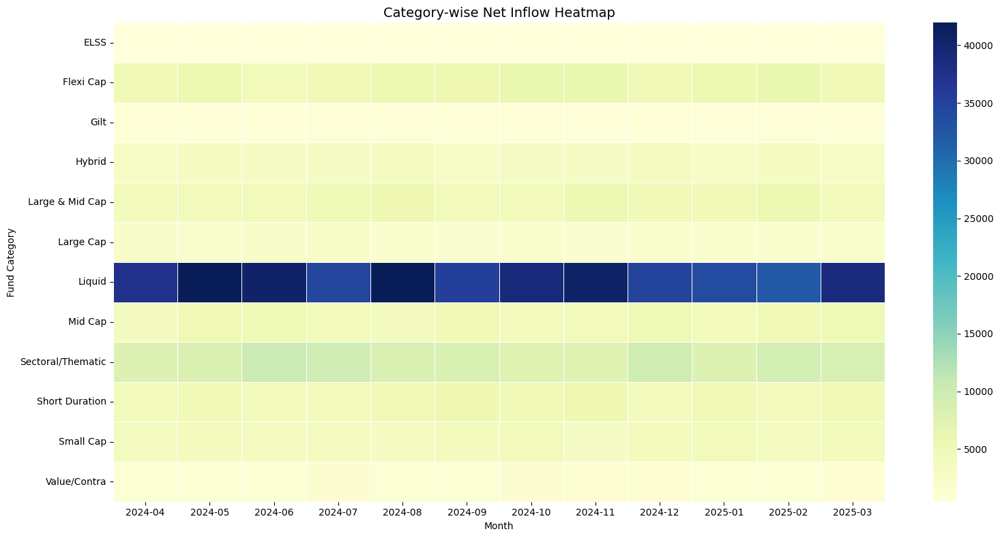

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16,8))

sns.heatmap(
    heatmap_data,
    cmap="YlGnBu",
    annot=False,
    linewidths=0.5
)

plt.title(
    "Category-wise Net Inflow Heatmap",
    fontsize=14
)

plt.xlabel("Month")
plt.ylabel("Fund Category")

plt.tight_layout()
plt.show()

## 4. Category Inflow Heatmap

This heatmap visualizes net inflows across mutual fund categories over time. Darker shades represent higher inflows, helping identify investor preferences and category-level trends. The visualization highlights periods where specific categories attracted significantly larger investments than others.

In [55]:
investor_df = pd.read_csv("../data/raw/08_investor_transactions.csv")

print(investor_df.columns.tolist())
investor_df.head()

['investor_id', 'transaction_date', 'amfi_code', 'transaction_type', 'amount_inr', 'state', 'city', 'city_tier', 'age_group', 'gender', 'annual_income_lakh', 'payment_mode', 'kyc_status']


,investor_id,transaction_date,amfi_code,transaction_type,amount_inr,state,city,city_tier,age_group,gender,annual_income_lakh,payment_mode,kyc_status
0,INV003054,2024-01-01,119092,SIP,1834,Telangana,Hyderabad,T30,56+,Female,77.1,UPI,Verified
1,INV002952,2024-01-01,148567,Redemption,392882,Punjab,Amritsar,B30,18-25,Male,7.1,Cheque,Verified
2,INV003420,2024-01-01,118636,SIP,912,Haryana,Faridabad,B30,36-45,Male,47.2,Mandate,Verified
3,INV003436,2024-01-01,118634,SIP,1102,Maharashtra,Mumbai,T30,36-45,Female,54.4,Cheque,Pending
4,INV004691,2024-01-01,119094,Lumpsum,8682,Delhi,Noida,T30,26-35,Male,14.5,Net Banking,Pending


In [56]:
import matplotlib.pyplot as plt

age_counts = investor_df["age_group"].value_counts()

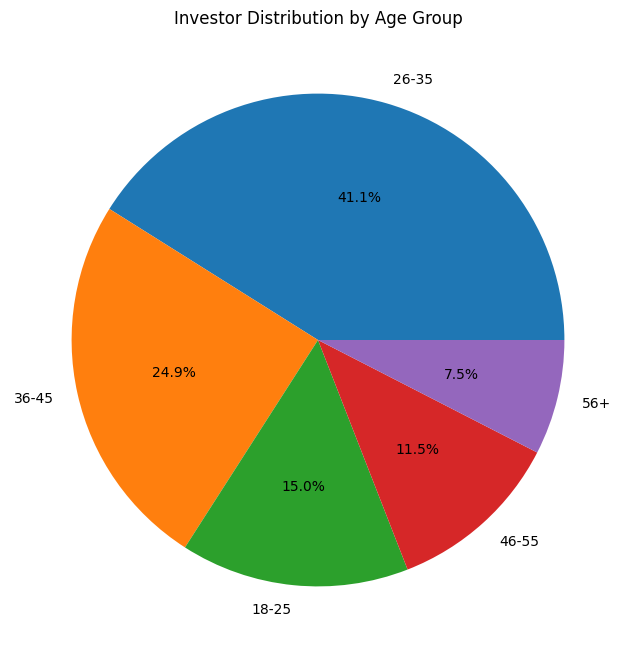

In [57]:
plt.figure(figsize=(8,8))

plt.pie(
    age_counts,
    labels=age_counts.index,
    autopct="%1.1f%%"
)

plt.title("Investor Distribution by Age Group")

plt.show()

In [58]:
sip_df = investor_df[
    investor_df["transaction_type"] == "SIP"
]

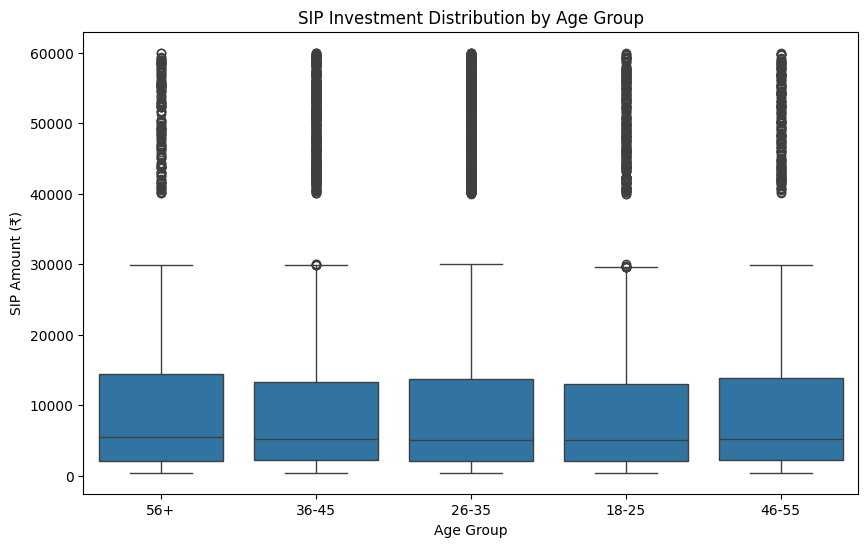

In [59]:
import seaborn as sns

plt.figure(figsize=(10,6))

sns.boxplot(
    data=sip_df,
    x="age_group",
    y="amount_inr"
)

plt.title(
    "SIP Investment Distribution by Age Group"
)

plt.xlabel("Age Group")
plt.ylabel("SIP Amount (₹)")

plt.show()

In [60]:
gender_counts = investor_df["gender"].value_counts()

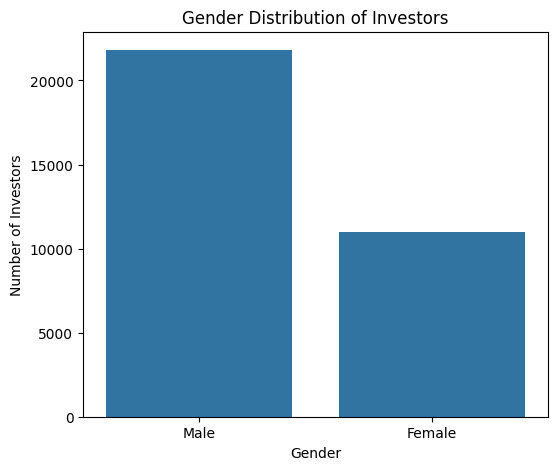

In [61]:
plt.figure(figsize=(6,5))

sns.barplot(
    x=gender_counts.index,
    y=gender_counts.values
)

plt.title("Gender Distribution of Investors")

plt.xlabel("Gender")
plt.ylabel("Number of Investors")

plt.show()

## 5. Investor Demographics Analysis

Investor demographics provide insights into participation patterns across age groups and genders. The analysis examines the distribution of investors by age, investment behavior through SIP contributions, and gender representation within the mutual fund ecosystem.

In [62]:
state_investment = (
    investor_df.groupby("state")["amount_inr"]
    .sum()
    .sort_values(ascending=False)
)

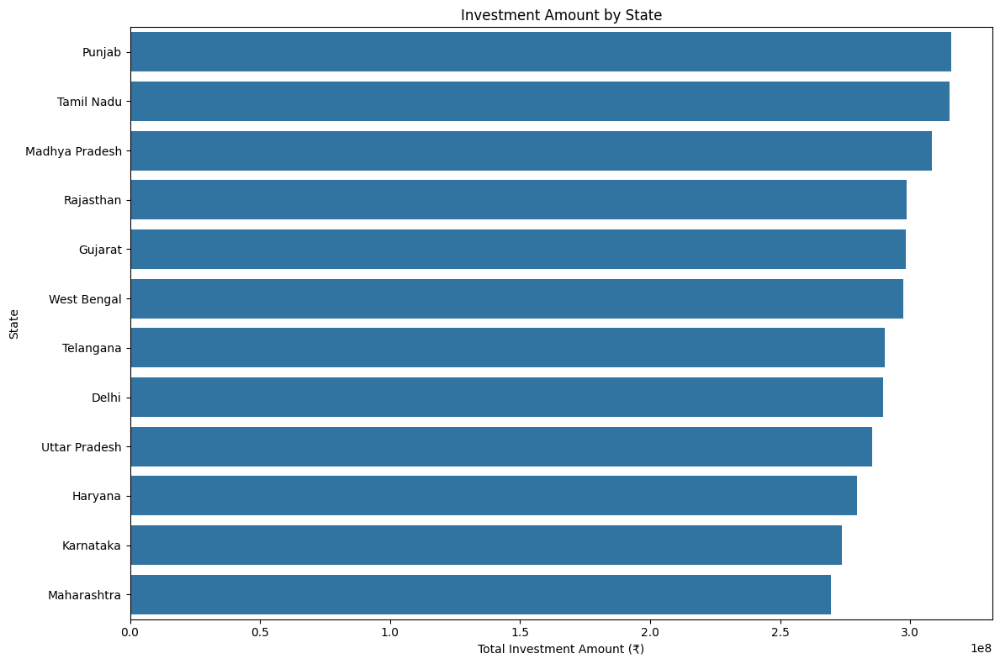

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,8))

sns.barplot(
    x=state_investment.values,
    y=state_investment.index
)

plt.title("Investment Amount by State")
plt.xlabel("Total Investment Amount (₹)")
plt.ylabel("State")

plt.tight_layout()
plt.show()

In [64]:
city_tier_counts = investor_df["city_tier"].value_counts()

In [65]:

print(city_tier_counts)

city_tier
T30    21719
B30    11059
Name: count, dtype: int64


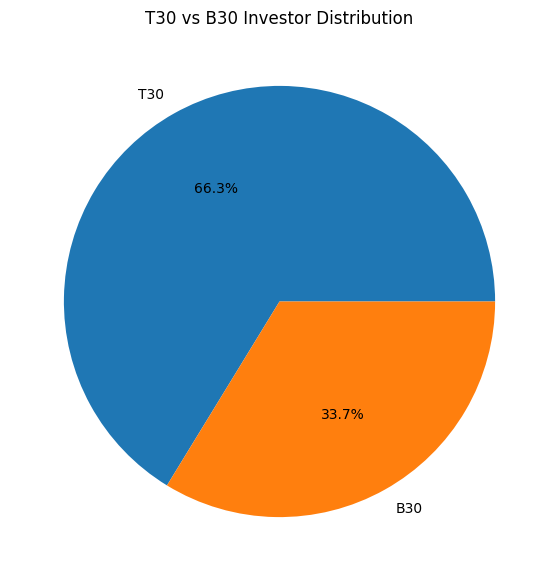

In [66]:
plt.figure(figsize=(7,7))

plt.pie(
    city_tier_counts,
    labels=city_tier_counts.index,
    autopct="%1.1f%%"
)

plt.title("T30 vs B30 Investor Distribution")

plt.show()

## 6. Geographic Distribution Analysis

This analysis explores the geographic spread of mutual fund investments across Indian states and city tiers. The charts highlight regional investment concentration and compare participation between Top 30 (T30) and Beyond 30 (B30) cities.

In [67]:
folio_df = pd.read_csv("../data/raw/06_industry_folio_count.csv")

In [68]:
print(folio_df.columns)
folio_df.head()

Index(['month', 'total_folios_crore', 'equity_folios_crore',
       'debt_folios_crore', 'hybrid_folios_crore', 'others_folios_crore'],
      dtype='str')


,month,total_folios_crore,equity_folios_crore,debt_folios_crore,hybrid_folios_crore,others_folios_crore
0,2022-01,13.26,9.28,1.86,0.80,1.33
1,2022-04,13.91,9.74,1.95,0.83,1.39
2,2022-07,13.85,9.69,1.94,0.83,1.38
3,2022-10,14.12,9.88,1.98,0.85,1.41
4,2023-01,14.81,10.37,2.07,0.89,1.48


In [69]:
folio_df["month"] = pd.to_datetime(folio_df["month"])

Text(0, 0.5, 'Folios (Crore)')

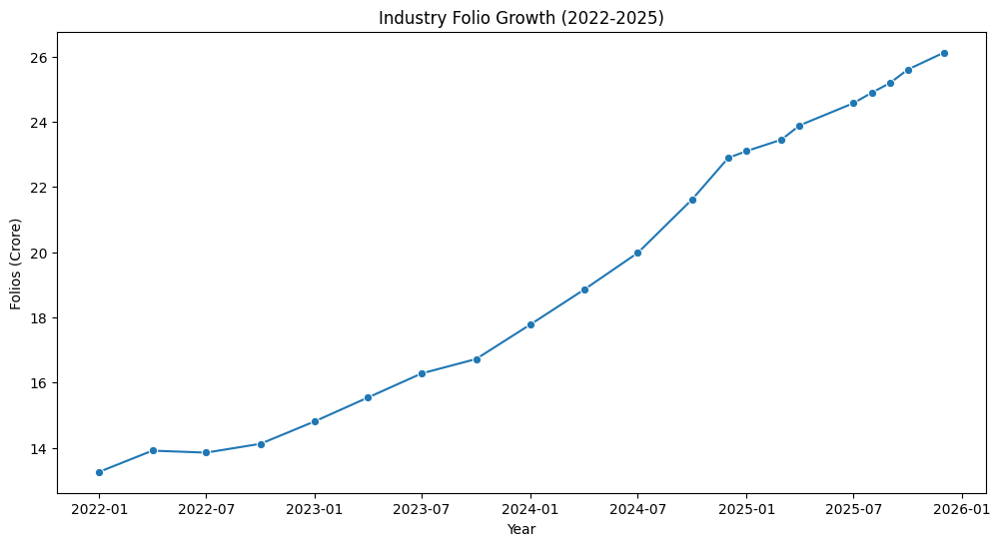

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,6))

sns.lineplot(
    data=folio_df,
    x="month",
    y="total_folios_crore",
    marker="o"
)

plt.title("Industry Folio Growth (2022-2025)")
plt.xlabel("Year")
plt.ylabel("Folios (Crore)")

Text(20, 20, '13.26 Cr')

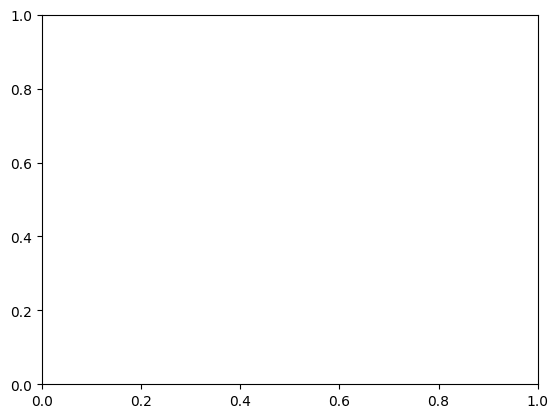

In [71]:
plt.annotate(
    "13.26 Cr",
    xy=(folio_df.iloc[0]["month"],
        folio_df.iloc[0]["total_folios_crore"]),
    xytext=(20,20),
    textcoords="offset points",
    arrowprops=dict(arrowstyle="->")
)

Text(-80, 20, '26.12 Cr')

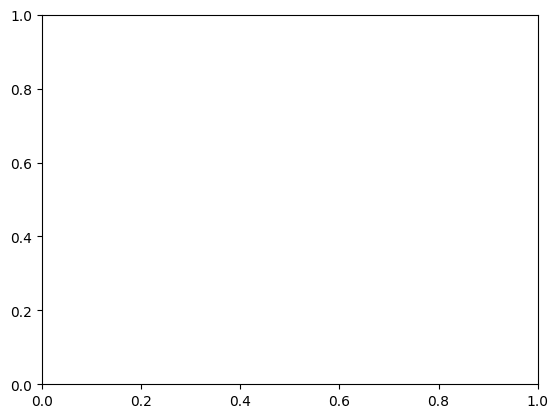

In [72]:
plt.annotate(
    "26.12 Cr",
    xy=(folio_df.iloc[-1]["month"],
        folio_df.iloc[-1]["total_folios_crore"]),
    xytext=(-80,20),
    textcoords="offset points",
    arrowprops=dict(arrowstyle="->")
)

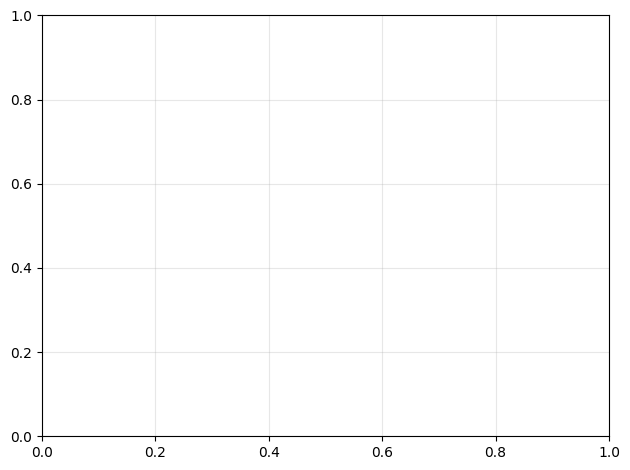

In [73]:
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

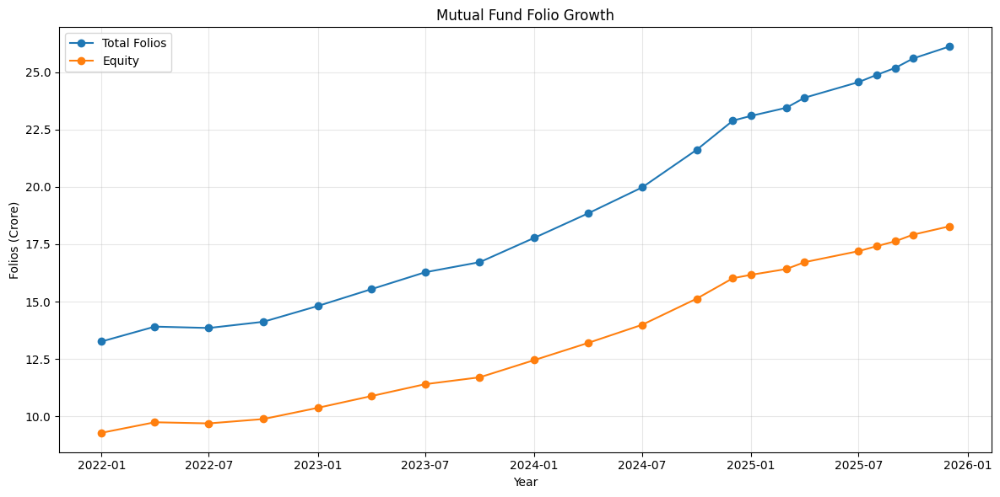

In [74]:
plt.figure(figsize=(12,6))

plt.plot(
    folio_df["month"],
    folio_df["total_folios_crore"],
    marker="o",
    label="Total Folios"
)

plt.plot(
    folio_df["month"],
    folio_df["equity_folios_crore"],
    marker="o",
    label="Equity"
)

plt.legend()

plt.title("Mutual Fund Folio Growth")
plt.xlabel("Year")
plt.ylabel("Folios (Crore)")

plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 7. Folio Count Growth Analysis

The mutual fund industry experienced substantial growth in folio counts between 2022 and 2025. Total folios increased from 13.26 crore to 26.12 crore, reflecting a significant rise in investor participation and account creation across mutual fund categories.

In [75]:

nav_df = pd.read_csv("../data/raw/02_nav_history.csv")
nav_df.head()
print(nav_df.columns)

Index(['amfi_code', 'date', 'nav'], dtype='str')


In [76]:
fund_df = pd.read_csv("../data/raw/01_fund_master.csv")

nav_merged = nav_df.merge(
    fund_df[["amfi_code", "scheme_name"]],
    on="amfi_code",
    how="left"
)

In [77]:
nav_merged["date"] = pd.to_datetime(nav_merged["date"])

In [78]:
selected_funds = (
    nav_merged["scheme_name"]
    .dropna()
    .unique()[:10]
)

print(selected_funds)

<StringArray>
[         'SBI Bluechip Fund - Regular Plan - Growth',
           'SBI Bluechip Fund - Direct Plan - Growth',
         'SBI Small Cap Fund - Regular Plan - Growth',
          'SBI Small Cap Fund - Direct Plan - Growth',
       'SBI Magnum Gilt Fund - Regular Plan - Growth',
          'HDFC Top 100 Fund - Regular Plan - Growth',
           'HDFC Top 100 Fund - Direct Plan - Growth',
 'HDFC Mid-Cap Opportunities Fund - Regular - Growth',
  'HDFC Mid-Cap Opportunities Fund - Direct - Growth',
       'HDFC Short Term Debt Fund - Regular - Growth']
Length: 10, dtype: str


In [79]:
corr_df = nav_merged[
    nav_merged["scheme_name"].isin(selected_funds)
]

In [80]:
nav_pivot = corr_df.pivot_table(
    index="date",
    columns="scheme_name",
    values="nav"
)

In [81]:
nav_pivot.head()

scheme_name,HDFC Mid-Cap Opportunities Fund - Direct - Growth,HDFC Mid-Cap Opportunities Fund - Regular - Growth,HDFC Short Term Debt Fund - Regular - Growth,HDFC Top 100 Fund - Direct Plan - Growth,HDFC Top 100 Fund - Regular Plan - Growth,SBI Bluechip Fund - Direct Plan - Growth,SBI Bluechip Fund - Regular Plan - Growth,SBI Magnum Gilt Fund - Regular Plan - Growth,SBI Small Cap Fund - Direct Plan - Growth,SBI Small Cap Fund - Regular Plan - Growth
date,,,,,,,,,,
2022-01-03,117.5969,107.3758,26.3169,560.1443,520.4608,58.4174,54.3856,42.1391,96.4565,89.8738
2022-01-04,117.0077,105.9447,26.2234,560.7052,515.0971,57.3480,54.3474,42.2508,94.6512,88.5495
2022-01-05,116.4011,105.4800,26.2221,563.0884,521.7239,57.0552,54.6869,42.4374,94.5436,88.0925
2022-01-06,116.0861,104.9350,26.1728,561.0675,515.7880,56.4224,55.4550,42.5901,93.7944,88.5175
2022-01-07,114.6164,104.3318,26.2261,559.5420,515.1639,57.2750,55.3692,42.4851,89.6438,91.4235


In [82]:
daily_returns = nav_pivot.pct_change()

In [83]:
daily_returns = daily_returns.dropna()

In [84]:
corr_matrix = daily_returns.corr()

In [85]:
corr_matrix.head()

scheme_name,HDFC Mid-Cap Opportunities Fund - Direct - Growth,HDFC Mid-Cap Opportunities Fund - Regular - Growth,HDFC Short Term Debt Fund - Regular - Growth,HDFC Top 100 Fund - Direct Plan - Growth,HDFC Top 100 Fund - Regular Plan - Growth,SBI Bluechip Fund - Direct Plan - Growth,SBI Bluechip Fund - Regular Plan - Growth,SBI Magnum Gilt Fund - Regular Plan - Growth,SBI Small Cap Fund - Direct Plan - Growth,SBI Small Cap Fund - Regular Plan - Growth
scheme_name,,,,,,,,,,
HDFC Mid-Cap Opportunities Fund - Direct - Growth,1.000000,-0.011916,-0.025505,0.027394,-0.016089,-0.052299,0.030454,-0.016315,0.041927,0.018443
HDFC Mid-Cap Opportunities Fund - Regular - Growth,-0.011916,1.000000,0.002150,-0.025137,-0.000006,-0.027471,-0.015559,-0.007166,-0.028323,0.006659
HDFC Short Term Debt Fund - Regular - Growth,-0.025505,0.002150,1.000000,0.011326,0.045567,-0.002803,0.017017,-0.040884,-0.034061,-0.065019
HDFC Top 100 Fund - Direct Plan - Growth,0.027394,-0.025137,0.011326,1.000000,0.047139,0.027796,0.016469,-0.010542,0.003347,-0.053278
HDFC Top 100 Fund - Regular Plan - Growth,-0.016089,-0.000006,0.045567,0.047139,1.000000,0.013663,0.040858,-0.022521,-0.000007,-0.030296


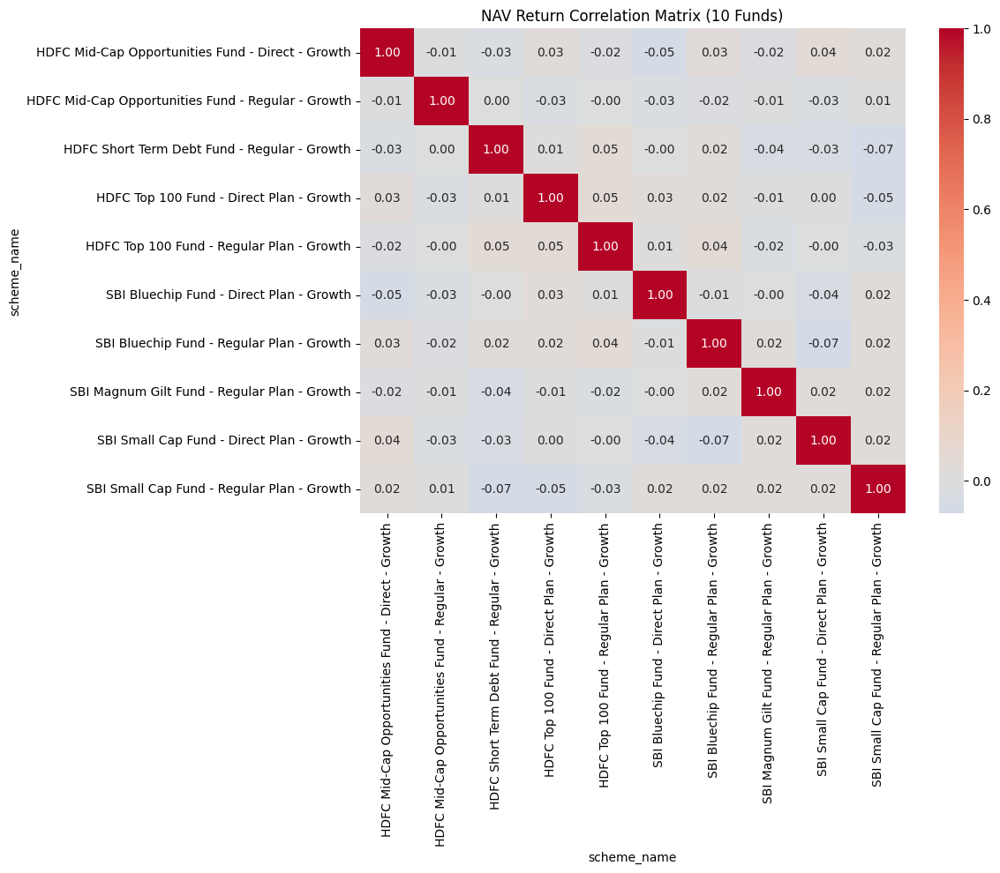

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,10))

sns.heatmap(
    corr_matrix,
    annot=True,
    cmap="coolwarm",
    center=0,
    fmt=".2f"
)

plt.title(
    "NAV Return Correlation Matrix (10 Funds)"
)

plt.tight_layout()
plt.show()

## 8. NAV Return Correlation Matrix

This heatmap shows the correlation between daily NAV returns of selected mutual fund schemes. High positive correlations indicate similar movement patterns among funds, while lower correlations suggest diversification opportunities.

In [87]:
holdings_df = pd.read_csv("../data/raw/09_portfolio_holdings.csv")

In [88]:
print(holdings_df.columns)
holdings_df.head()

Index(['amfi_code', 'stock_symbol', 'stock_name', 'sector', 'weight_pct',
       'market_value_cr', 'current_price_inr', 'portfolio_date'],
      dtype='str')


,amfi_code,stock_symbol,stock_name,sector,weight_pct,market_value_cr,current_price_inr,portfolio_date
0,119551,POWERGRID,Power Grid Corporation,Utilities,13.85,737.09,6011.08,2025-12-31
1,119551,HDFCBANK,HDFC Bank Ltd,Banking,11.19,88.97,1074.65,2025-12-31
2,119551,GRASIM,Grasim Industries Ltd,Diversified,9.90,208.45,5964.59,2025-12-31
3,119551,DRREDDY,Dr. Reddy's Laboratories,Pharma,4.76,161.32,3748.82,2025-12-31
4,119551,ASIANPAINT,Asian Paints Ltd,Paints,10.25,725.90,1321.45,2025-12-31


In [89]:
sector_allocation = (
    holdings_df.groupby("sector")["weight_pct"]
    .sum()
    .sort_values(ascending=False)
)

In [90]:
print(sector_allocation)

sector
Banking           652.26
IT                455.47
Pharma            407.45
Automobile        323.65
Utilities         265.54
FMCG              229.11
Infrastructure    192.16
Diversified       169.23
Telecom           145.62
Consumer Goods    127.61
NBFC              119.09
Energy            117.91
Cement            105.03
Paints             89.86
Name: weight_pct, dtype: float64


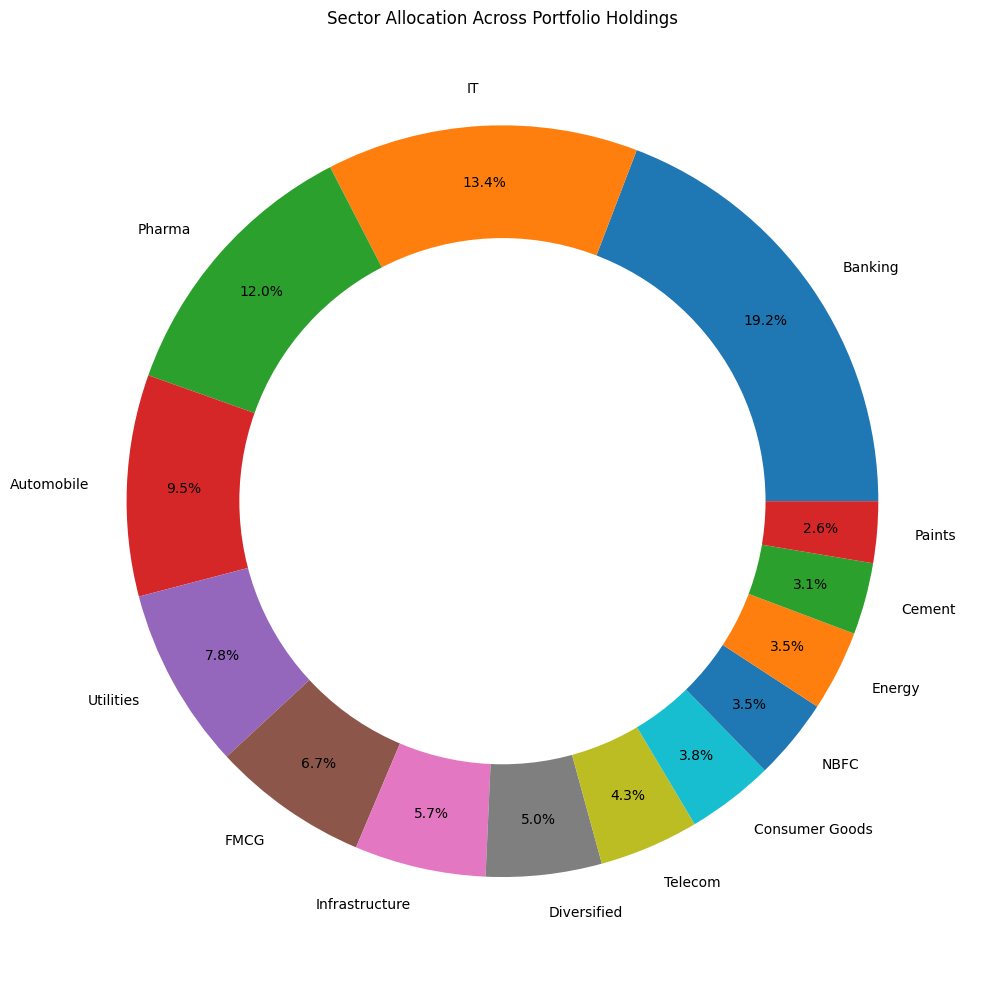

In [91]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))

plt.pie(
    sector_allocation,
    labels=sector_allocation.index,
    autopct="%1.1f%%",
    pctdistance=0.85
)

# Create donut hole
centre_circle = plt.Circle(
    (0,0),
    0.70,
    fc="white"
)

fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title("Sector Allocation Across Portfolio Holdings")

plt.tight_layout()
plt.show()

## 9. Sector Allocation Analysis

This donut chart illustrates sector exposure across mutual fund portfolio holdings. The allocation highlights the sectors receiving the largest portfolio weights and provides insight into diversification patterns across the sampled funds.

# Key EDA Findings

1. Mutual fund NAVs showed strong growth during the 2023 bull market, followed by moderation during the 2024 correction phase.

2. SBI Mutual Fund maintained the highest AUM, reaching approximately ₹12.5 lakh crore by 2025.

3. Monthly SIP inflows increased consistently and reached an all-time high of ₹31,002 crore in December 2025.

4. Liquid Funds attracted the highest category-level inflows throughout the observed period.

5. Flexi Cap, Mid Cap, and Large & Mid Cap funds remained popular among investors.

6. The 26–45 age group represented the largest share of mutual fund investors.

7. Older investors generally contributed larger SIP amounts than younger age groups.

8. Major states and metropolitan regions accounted for a substantial share of total investments.

9. Total mutual fund folios nearly doubled from 13.26 crore to 26.12 crore between 2022 and 2025.

10. Banking, Utilities, Pharma, and diversified sectors formed a significant portion of portfolio allocations.